In [21]:
%pip install tf_keras_vis

Note: you may need to restart the kernel to use updated packages.


# Create your dataset

1) Choose which classes you would like to add.

2) Create a dataset with your own photos

3) Separate your dataset into train and test subsets.

In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import PIL.Image

from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.layers import (Resizing, Rescaling,)
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom
from tensorflow.keras import Sequential
from glob import glob
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from tensorflow.keras import Model
from tensorflow.keras.layers import (GlobalAveragePooling2D, Dense, Dropout)

In [3]:
def create_dataframe_from_directories(path):
    data = []

    for label_dir in os.listdir(path):
        if os.path.isfile(label_dir):
            continue

        label_path_path = os.path.join(path, label_dir)
        for file in os.listdir(label_path_path):
            data.append([os.path.join(label_path_path, file), label_dir])
        
    return pd.DataFrame(data, columns = ["path", "label"])

In [4]:
# If you're using Google Colab, you need to upload your data to Google Drive.
# Then, run the following code to mount your Google Drive and access your files in Colab.

#from google.colab import drive
#drive.mount('/content/drive')

In [5]:
# Configuration
dataset_path = "dataset"
batch_size = 32
img_size = (224, 224)
seed = 123

# Chargement du dataset brut
raw_train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_path,
    validation_split=0.2,
    subset="training",
    seed=seed,
    image_size=img_size,
    batch_size=batch_size
)

raw_val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    dataset_path,
    validation_split=0.2,
    subset="validation",
    seed=seed,
    image_size=img_size,
    batch_size=batch_size
)

# Affichage des noms de classes détectées
class_names = raw_train_ds.class_names
print("Classes détectées :", class_names)

# Prétraitement MobileNetV2
train_ds = raw_train_ds.map(lambda x, y: (preprocess_input(x), y)).cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = raw_val_ds.map(lambda x, y: (preprocess_input(x), y)).cache().prefetch(buffer_size=tf.data.AUTOTUNE)

Found 300 files belonging to 5 classes.
Using 240 files for training.
Found 300 files belonging to 5 classes.
Using 60 files for validation.
Classes détectées : ['bieres', 'champagne', 'sans_alcool', 'spiritueux', 'vins']


**TODO**: Display some images of your dataset

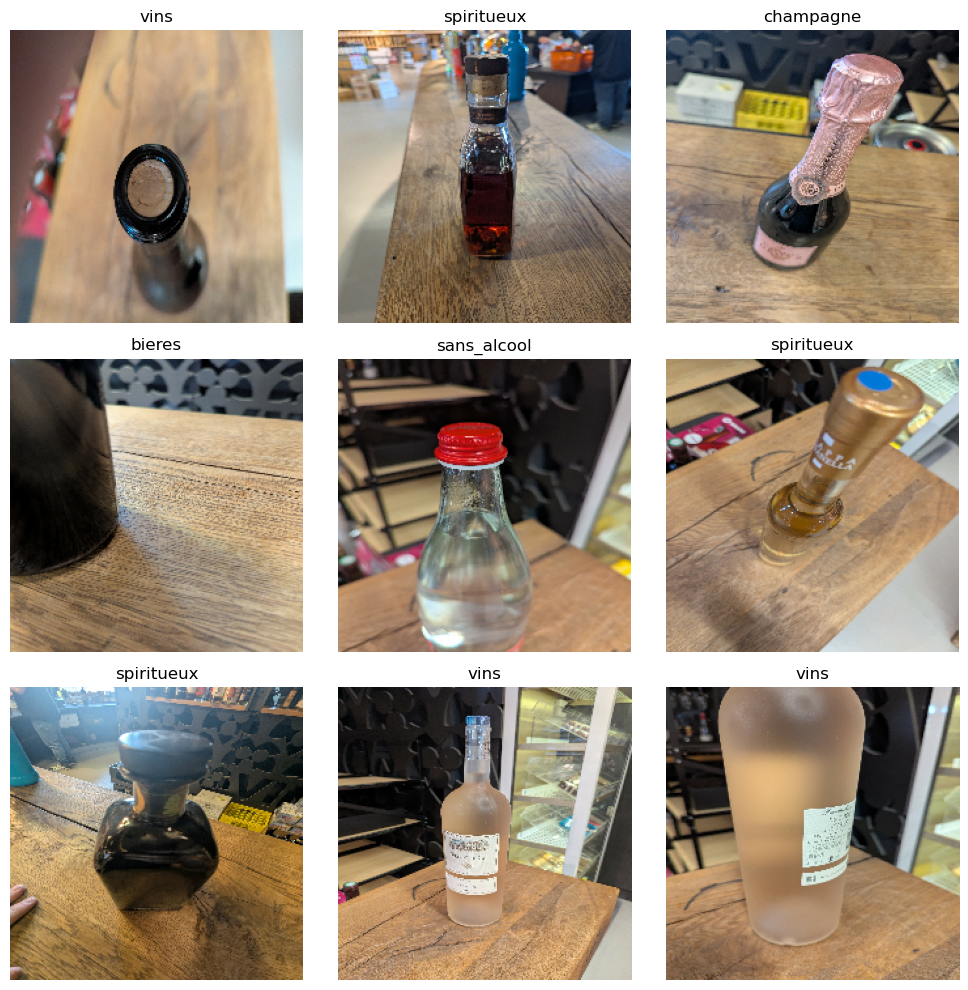

In [22]:
# Affichage de 9 images aléatoires avec leur étiquette
num_images = 9
image_batch, label_batch = next(iter(raw_train_ds))

plt.figure(figsize=(10, 10))
for i in range(num_images):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image_batch[i].numpy().astype("uint8"))
    plt.title(class_names[label_batch[i]])
    plt.axis("off")
plt.tight_layout()
plt.show()

# Explore your dataset

**TODO**: count the number of examples per classes and plot an histogram of it

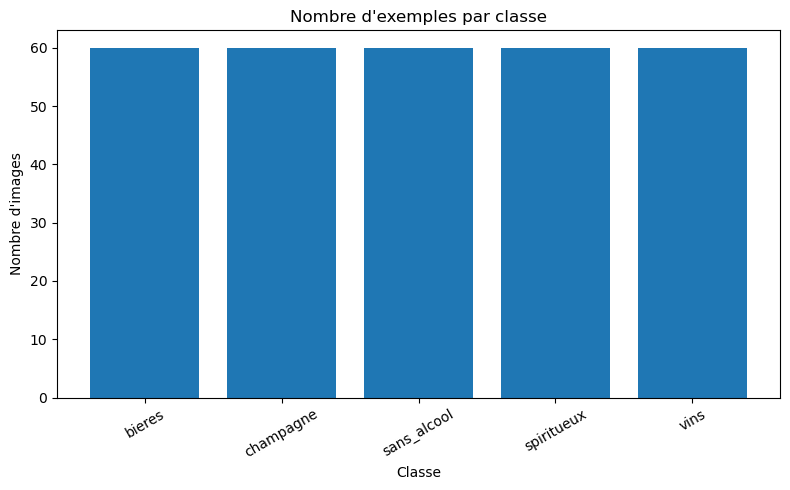

In [24]:
# Compter les images par classe dans le dossier dataset
class_counts = {}
for class_name in os.listdir(dataset_path):
    class_dir = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_dir):
        class_counts[class_name] = len(os.listdir(class_dir))

# Affichage de l'histogramme
plt.figure(figsize=(8, 5))
plt.bar(class_counts.keys(), class_counts.values())
plt.title("Nombre d'exemples par classe")
plt.xlabel("Classe")
plt.ylabel("Nombre d'images")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

# Preprocessing steps

In [8]:
IMG_HEIGHT = 224
IMG_WIDTH = 224

image_preprocesses = Sequential([
    Resizing(IMG_HEIGHT, IMG_WIDTH, crop_to_aspect_ratio=True),
    Rescaling(1. / 255)
])

image_augmentations = Sequential([
    # TODO: choose some image augmentations layers
    # see which keras layers you can use
    # The kind of layers you will want to use starts with "Random".
    # See the following page for more information on data augmentation :
    # https://www.tensorflow.org/tutorials/images/data_augmentation
    
    RandomFlip("horizontal"),      # retournement horizontal aléatoire
    RandomRotation(0.1),           # rotation aléatoire de ±10%
    RandomZoom(0.1),               # zoom in/out aléatoire
])

def open_image(path):
    with PIL.Image.open(path) as image:
        image = image.convert("RGB")  # Assure 3 canaux
        image_array = np.asarray(image)
        processed_image = image_preprocesses(image_array)
    return processed_image

def open_images(paths):
    return tf.stack([
        open_image(path) for path in paths
    ])

def augment_images(images):
    return image_augmentations(images)

**TODO**: plot examples of preprocessed and augmented images

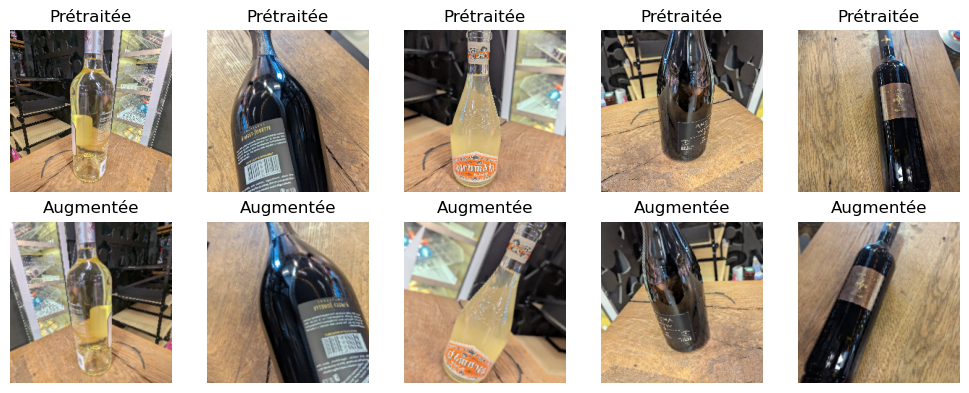

In [9]:
# Sélection de quelques chemins d’images depuis le dataframe (si vous l'avez créé)
train_df = create_dataframe_from_directories(dataset_path)
sample_paths = train_df.sample(5, random_state=seed)["path"].tolist()

# Chargement et prétraitement des images
original_images = open_images(sample_paths)

# Augmentation des images
augmented_images = augment_images(original_images)

# Affichage
plt.figure(figsize=(10, 4))
for i in range(len(sample_paths)):
    # Image originale
    ax = plt.subplot(2, len(sample_paths), i + 1)
    plt.imshow(original_images[i].numpy())
    plt.title("Prétraitée")
    plt.axis("off")
    
    # Image augmentée
    ax = plt.subplot(2, len(sample_paths), i + 1 + len(sample_paths))
    plt.imshow(augmented_images[i].numpy())
    plt.title("Augmentée")
    plt.axis("off")

plt.tight_layout()
plt.show()

## Define model

In [10]:
def get_model(num_classes=5):
    base_model = MobileNetV2(
        input_shape=(224, 224, 3),
        weights='imagenet',
        include_top=False
    )

    # Geler les couches du modèle de base
    base_model.trainable = False

    # Ajout de nouvelles couches
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dropout(0.2)(x)
    x = Dense(128, activation='relu')(x)
    x = Dense(num_classes, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=x)

    model.compile(
        optimizer=RMSprop(learning_rate=0.0001),
        loss=SparseCategoricalCrossentropy(),
        metrics=['acc']
    )

    return model

In [11]:
get_model().summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)    │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 112, 112, 32)      │             864 │ input_layer_2[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 112, 112, 32)      │             128 │ Conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 112, 112, 32)      │               0 │ bn_Conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise       │ (None, 112, 112, 32)      │             288 │ Conv1_relu[0][0]           │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 112, 112, 32)      │             128 │ expanded_conv_depthwise[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 112, 112, 32)      │               0 │ expanded_conv_depthwise_B… │
│ (ReLU)                        │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project         │ (None, 112, 112, 16)      │             512 │ expanded_conv_depthwise_r… │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project_BN      │ (None, 112, 112, 16)      │              64 │ expanded_conv_project[0][… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 112, 112, 96)      │           1,536 │ expanded_conv_project_BN[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_BN             │ (None, 112, 112, 96)      │             384 │ block_1_expand[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 112, 112, 96)      │               0 │ block_1_expand_BN[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 113, 113, 96)      │               0 │ block_1_expand_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_depthwise             │ (None, 56, 56, 96)        │             864 │ block_1_pad[0][0]          │
│ (DepthwiseConv2D)             │                           │               

 Total params: 2,422,597 (9.24 MB)

 Trainable params: 164,613 (643.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

# Model training

**TODO**: cross-validate your model, you can base yourself on the code from the first part of this practical work

**NOTE**: you shouldn't augment validations images. What we want to evaluate is the performances on "real" images, not on images that are augmented and change all the time 

In [27]:
# ------------------------------------------------------------------
# 1. (Re)définition d'un bloc d'augmentations sans batch figé
def get_augmentations():
    return tf.keras.Sequential([
        RandomFlip("horizontal"),
        RandomRotation(0.1),
        RandomZoom(0.1),
    ], name="data_augmentation")

# ------------------------------------------------------------------
results = []
for fold, (train_idx, val_idx) in enumerate(skf.split(paths, labels), 1):
    print(f"\n===== FOLD {fold}/{num_folds} =====")

    aug_layer = get_augmentations()          # ← recréé à chaque fold

    train_ds = (tf.data.Dataset.from_tensor_slices((paths[train_idx], labels[train_idx]))
                  .shuffle(len(train_idx))
                  .map(path_to_tensor, num_parallel_calls=tf.data.AUTOTUNE)
                  .batch(batch_size)                             # batch d’abord
                  .map(lambda x, y: (aug_layer(x, training=True), y),
                       num_parallel_calls=tf.data.AUTOTUNE)      # puis augmentation
                  .prefetch(tf.data.AUTOTUNE))

    val_ds   = (tf.data.Dataset.from_tensor_slices((paths[val_idx], labels[val_idx]))
                  .map(path_to_tensor, num_parallel_calls=tf.data.AUTOTUNE)
                  .batch(batch_size)                             # aucun augm. ici
                  .prefetch(tf.data.AUTOTUNE))

    model = get_model(num_classes=len(class_names))
    es    = tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)

    history = model.fit(train_ds,
                        epochs=30,
                        validation_data=val_ds,
                        callbacks=[es],
                        verbose=2)

    val_loss, val_acc = model.evaluate(val_ds, verbose=0)
    print(f"✔️  Fold {fold} – val_acc : {val_acc:.3f}")
    results.append(val_acc)

print("\n=== RÉSUMÉ DES FOLDS ===")
for i, acc in enumerate(results, 1):
    print(f"Fold {i} : {acc:.3f}")
print(f"Précision moyenne : {np.mean(results):.3f} ± {np.std(results):.3f}")



===== FOLD 1/5 =====
Epoch 1/30
8/8 - 8s - 1000ms/step - acc: 0.2208 - loss: 1.7655 - val_acc: 0.2500 - val_loss: 1.6470
Epoch 2/30
8/8 - 4s - 479ms/step - acc: 0.2625 - loss: 1.6726 - val_acc: 0.3333 - val_loss: 1.5486
Epoch 3/30
8/8 - 4s - 487ms/step - acc: 0.3458 - loss: 1.5154 - val_acc: 0.3167 - val_loss: 1.5067
Epoch 4/30
8/8 - 4s - 503ms/step - acc: 0.3875 - loss: 1.4558 - val_acc: 0.3667 - val_loss: 1.4597
Epoch 5/30
8/8 - 4s - 506ms/step - acc: 0.4250 - loss: 1.3729 - val_acc: 0.4333 - val_loss: 1.4029
Epoch 6/30
8/8 - 4s - 514ms/step - acc: 0.4792 - loss: 1.3172 - val_acc: 0.4500 - val_loss: 1.3649
Epoch 7/30
8/8 - 4s - 497ms/step - acc: 0.4583 - loss: 1.3552 - val_acc: 0.5333 - val_loss: 1.3155
Epoch 8/30
8/8 - 4s - 535ms/step - acc: 0.5125 - loss: 1.2387 - val_acc: 0.4833 - val_loss: 1.2869
Epoch 9/30
8/8 - 4s - 514ms/step - acc: 0.5375 - loss: 1.1877 - val_acc: 0.5167 - val_loss: 1.2462
Epoch 10/30
8/8 - 4s - 544ms/step - acc: 0.5667 - loss: 1.1602 - val_acc: 0.4833 - val

Epoch 22/30
8/8 - 5s - 629ms/step - acc: 0.6917 - loss: 0.8169 - val_acc: 0.4167 - val_loss: 1.3550
Epoch 23/30
8/8 - 5s - 631ms/step - acc: 0.7583 - loss: 0.7140 - val_acc: 0.4833 - val_loss: 1.3087
Epoch 24/30
8/8 - 5s - 666ms/step - acc: 0.7333 - loss: 0.7586 - val_acc: 0.4667 - val_loss: 1.2984
Epoch 25/30
8/8 - 5s - 647ms/step - acc: 0.7333 - loss: 0.7520 - val_acc: 0.4833 - val_loss: 1.3198
Epoch 26/30
8/8 - 5s - 644ms/step - acc: 0.7167 - loss: 0.7160 - val_acc: 0.4833 - val_loss: 1.2998
Epoch 27/30
8/8 - 5s - 685ms/step - acc: 0.7958 - loss: 0.6444 - val_acc: 0.5000 - val_loss: 1.2905
Epoch 28/30
8/8 - 5s - 647ms/step - acc: 0.7583 - loss: 0.6840 - val_acc: 0.5000 - val_loss: 1.2600
Epoch 29/30
8/8 - 5s - 637ms/step - acc: 0.7833 - loss: 0.6720 - val_acc: 0.5000 - val_loss: 1.2814
Epoch 30/30
8/8 - 5s - 633ms/step - acc: 0.7500 - loss: 0.6832 - val_acc: 0.5333 - val_loss: 1.2625
✔️  Fold 3 – val_acc : 0.500

===== FOLD 4/5 =====
Epoch 1/30
8/8 - 9s - 1s/step - acc: 0.2000 - los

# Results

**TODO**: plot the results from your crossvalidation

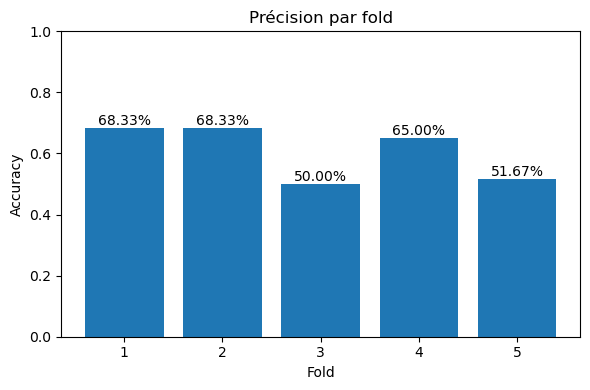

Précision moyenne : 0.607 ± 0.081


In [28]:
import matplotlib.pyplot as plt
import numpy as np

# results : liste des précisions que vous avez remplie pendant la CV
folds = np.arange(1, len(results) + 1)

plt.figure(figsize=(6, 4))
plt.bar(folds, results)
plt.ylim(0, 1)
plt.title("Précision par fold")
plt.xlabel("Fold")
plt.ylabel("Accuracy")
for x, y in zip(folds, results):
    plt.text(x, y + 0.01, f"{y:.2%}", ha='center')  # affiche la valeur au-dessus de chaque barre
plt.tight_layout()
plt.show()

print(f"Précision moyenne : {np.mean(results):.3f} ± {np.std(results):.3f}")


## Evaluate model on test set

**TODO**: when you've selected a final model, evaluate its performances (f-score, confusion matrix, ...) on your test set

Epoch 1/30

Epoch 1: val_acc improved from -inf to 0.33333, saving model to best_model.h5


8/8 - 8s - 992ms/step - acc: 0.2417 - loss: 1.7277 - val_acc: 0.3333 - val_loss: 1.5095
Epoch 2/30

Epoch 2: val_acc improved from 0.33333 to 0.35000, saving model to best_model.h5


8/8 - 5s - 676ms/step - acc: 0.3042 - loss: 1.5699 - val_acc: 0.3500 - val_loss: 1.4620
Epoch 3/30

Epoch 3: val_acc did not improve from 0.35000
8/8 - 5s - 639ms/step - acc: 0.3292 - loss: 1.5260 - val_acc: 0.3500 - val_loss: 1.4088
Epoch 4/30

Epoch 4: val_acc improved from 0.35000 to 0.41667, saving model to best_model.h5


8/8 - 5s - 671ms/step - acc: 0.3500 - loss: 1.4987 - val_acc: 0.4167 - val_loss: 1.3976
Epoch 5/30

Epoch 5: val_acc did not improve from 0.41667
8/8 - 9s - 1s/step - acc: 0.4250 - loss: 1.3679 - val_acc: 0.4000 - val_loss: 1.3556
Epoch 6/30

Epoch 6: val_acc improved from 0.41667 to 0.50000, saving model to best_model.h5


8/8 - 5s - 658ms/step - acc: 0.4375 - loss: 1.3232 - val_acc: 0.5000 - val_loss: 1.3499
Epoch 7/30

Epoch 7: val_acc did not improve from 0.50000
8/8 - 5s - 650ms/step - acc: 0.4625 - loss: 1.3258 - val_acc: 0.4833 - val_loss: 1.3030
Epoch 8/30

Epoch 8: val_acc did not improve from 0.50000
8/8 - 5s - 627ms/step - acc: 0.5417 - loss: 1.2322 - val_acc: 0.5000 - val_loss: 1.2791
Epoch 9/30

Epoch 9: val_acc improved from 0.50000 to 0.55000, saving model to best_model.h5


8/8 - 5s - 646ms/step - acc: 0.5667 - loss: 1.1581 - val_acc: 0.5500 - val_loss: 1.2489
Epoch 10/30

Epoch 10: val_acc did not improve from 0.55000
8/8 - 5s - 619ms/step - acc: 0.5375 - loss: 1.1426 - val_acc: 0.5500 - val_loss: 1.2252
Epoch 11/30

Epoch 11: val_acc did not improve from 0.55000
8/8 - 5s - 619ms/step - acc: 0.6125 - loss: 1.0683 - val_acc: 0.5333 - val_loss: 1.2056
Epoch 12/30

Epoch 12: val_acc did not improve from 0.55000
8/8 - 5s - 628ms/step - acc: 0.5917 - loss: 1.0755 - val_acc: 0.5500 - val_loss: 1.2026
Epoch 13/30

Epoch 13: val_acc improved from 0.55000 to 0.60000, saving model to best_model.h5


8/8 - 5s - 666ms/step - acc: 0.6083 - loss: 1.0291 - val_acc: 0.6000 - val_loss: 1.1617
Epoch 14/30

Epoch 14: val_acc did not improve from 0.60000
8/8 - 5s - 640ms/step - acc: 0.6333 - loss: 1.0310 - val_acc: 0.5500 - val_loss: 1.1459
Epoch 15/30

Epoch 15: val_acc did not improve from 0.60000
8/8 - 5s - 637ms/step - acc: 0.6500 - loss: 0.9630 - val_acc: 0.5500 - val_loss: 1.1308
Epoch 16/30

Epoch 16: val_acc did not improve from 0.60000
8/8 - 5s - 647ms/step - acc: 0.6625 - loss: 0.9593 - val_acc: 0.5667 - val_loss: 1.1183
Epoch 17/30

Epoch 17: val_acc did not improve from 0.60000
8/8 - 5s - 645ms/step - acc: 0.6708 - loss: 0.9207 - val_acc: 0.5833 - val_loss: 1.0945
Epoch 18/30

Epoch 18: val_acc did not improve from 0.60000
8/8 - 5s - 656ms/step - acc: 0.6958 - loss: 0.8808 - val_acc: 0.5500 - val_loss: 1.0825
Epoch 19/30

Epoch 19: val_acc did not improve from 0.60000
8/8 - 5s - 651ms/step - acc: 0.6958 - loss: 0.8991 - val_acc: 0.5667 - val_loss: 1.0829
Epoch 20/30

Epoch 20: v

8/8 - 5s - 670ms/step - acc: 0.6667 - loss: 0.9055 - val_acc: 0.6333 - val_loss: 1.0547
Epoch 21/30

Epoch 21: val_acc did not improve from 0.63333
8/8 - 5s - 646ms/step - acc: 0.7458 - loss: 0.7995 - val_acc: 0.6333 - val_loss: 1.0524
Epoch 22/30

Epoch 22: val_acc did not improve from 0.63333
8/8 - 5s - 653ms/step - acc: 0.6875 - loss: 0.8265 - val_acc: 0.6000 - val_loss: 1.0335
Epoch 23/30

Epoch 23: val_acc did not improve from 0.63333
8/8 - 5s - 625ms/step - acc: 0.7625 - loss: 0.7358 - val_acc: 0.6167 - val_loss: 1.0224
Epoch 24/30

Epoch 24: val_acc did not improve from 0.63333
8/8 - 5s - 644ms/step - acc: 0.7500 - loss: 0.7744 - val_acc: 0.5833 - val_loss: 1.0154
Epoch 25/30

Epoch 25: val_acc did not improve from 0.63333
8/8 - 5s - 634ms/step - acc: 0.8125 - loss: 0.6940 - val_acc: 0.6000 - val_loss: 1.0118
Epoch 26/30

Epoch 26: val_acc did not improve from 0.63333
8/8 - 5s - 630ms/step - acc: 0.7500 - loss: 0.7187 - val_acc: 0.6000 - val_loss: 1.0185
Epoch 27/30

Epoch 27: v

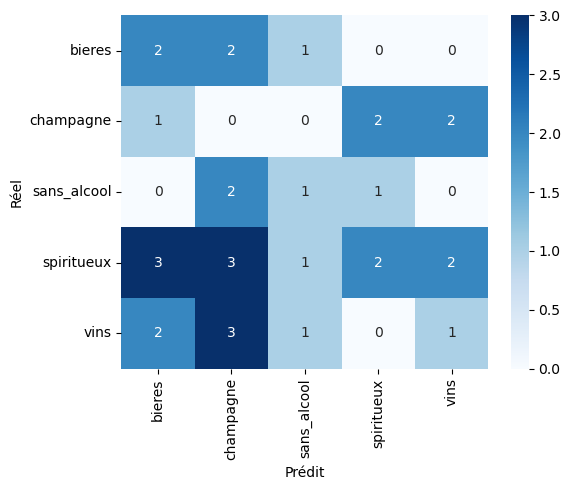

In [29]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# -------- 1) (ré)entrainement complet + sauvegarde du meilleur poids --------
final_model = get_model(num_classes=len(class_names))
ckpt = tf.keras.callbacks.ModelCheckpoint("best_model.h5",
                                          monitor="val_acc",
                                          mode="max",
                                          save_best_only=True,
                                          verbose=1)
es   = tf.keras.callbacks.EarlyStopping(patience=8, restore_best_weights=True)

history = final_model.fit(train_ds,
                          epochs=30,
                          validation_data=val_ds,
                          callbacks=[ckpt, es],
                          verbose=2)

best_model = tf.keras.models.load_model("best_model.h5", compile=False)
best_model.compile(optimizer="adam",
                   loss=SparseCategoricalCrossentropy(),
                   metrics=["acc"])

# -------- 2) Évaluation sur le test set --------
y_true = np.concatenate([y for _, y in test_ds])
y_prob = best_model.predict(test_ds)
y_pred = np.argmax(y_prob, axis=1)

print(classification_report(y_true, y_pred, target_names=class_names, digits=3))

cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Prédit"); plt.ylabel("Réel"); plt.tight_layout(); plt.show()


### Display some misclassified images

**TODO**: display some misclassified images to be able to see what images are difficult for the model

Found 300 files belonging to 5 classes.
71 images mal classées


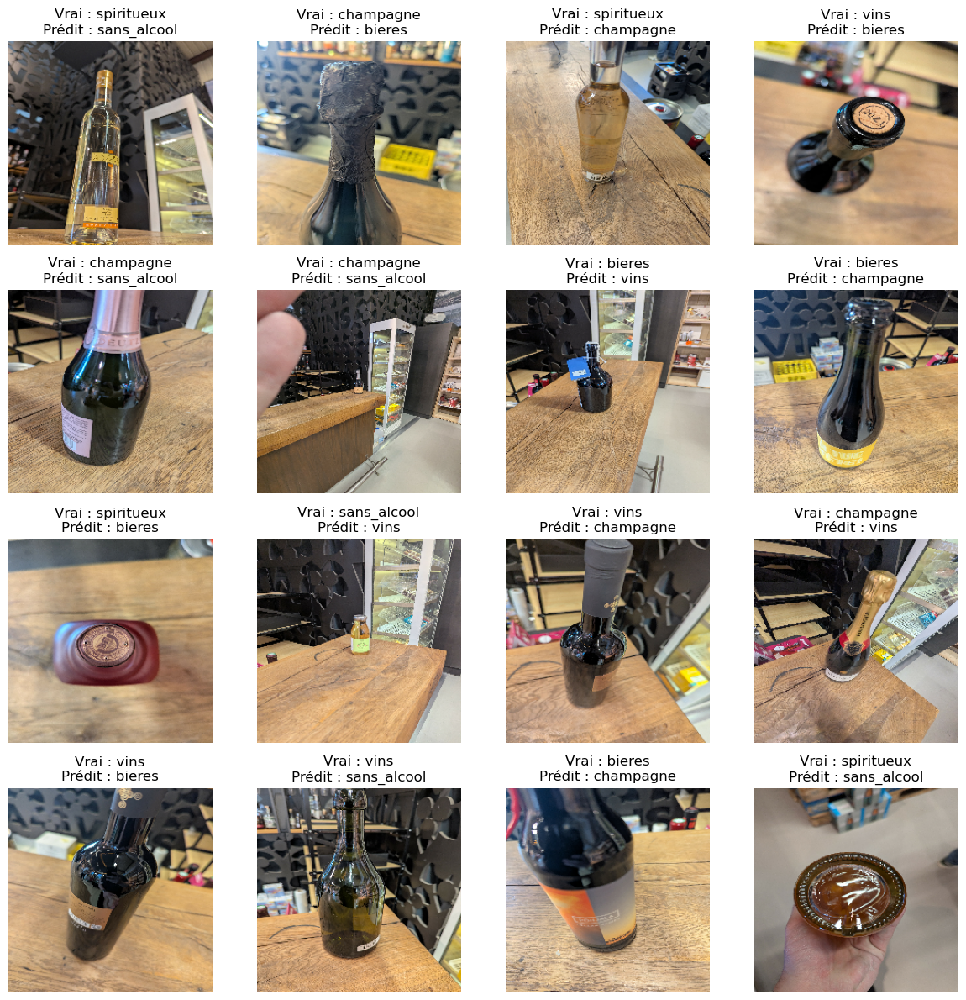

In [30]:
# Récupération des images d'origine (non pré-traitées) + vrais labels
orig_images, y_true_full = [], []
for batch_x, batch_y in tf.keras.preprocessing.image_dataset_from_directory(
        dataset_path,
        image_size=img_size,
        batch_size=1,
        shuffle=False):
    orig_images.append(batch_x[0].numpy().astype("uint8"))
    y_true_full.append(batch_y[0].numpy())
orig_images = np.array(orig_images)
y_true_full = np.array(y_true_full)

# Prédictions
imgs_preproc = preprocess_input(orig_images.copy())
y_pred_full  = np.argmax(best_model.predict(imgs_preproc, batch_size=batch_size, verbose=0), axis=1)

# Indices des erreurs
mis_idx = np.where(y_true_full != y_pred_full)[0]
print(f"{len(mis_idx)} images mal classées")

# Affichage
k = min(16, len(mis_idx))
sample_idx = np.random.choice(mis_idx, k, replace=False)
plt.figure(figsize=(12, 12))
for i, idx in enumerate(sample_idx):
    ax = plt.subplot(4, 4, i + 1)
    plt.imshow(orig_images[idx])
    plt.title(f"Vrai : {class_names[y_true_full[idx]]}\nPrédit : {class_names[y_pred_full[idx]]}")
    plt.axis("off")
plt.tight_layout()
plt.show()


## Use grad-cam to inspect how the model classify
Here we can see an heatmap of the regions that activates the model the most.

### For more information:
- tf-keras-vis documentation: https://keisen.github.io/tf-keras-vis-docs/
- Grad-cam paper: https://arxiv.org/pdf/1610.02391.pdf
- Grad-cam++ paper: https://arxiv.org/pdf/1710.11063.pdf

**NOTE**: maybe you will need to adapt some variable names based on your code above. For example, _model_ should be the model trained on all the training data. 

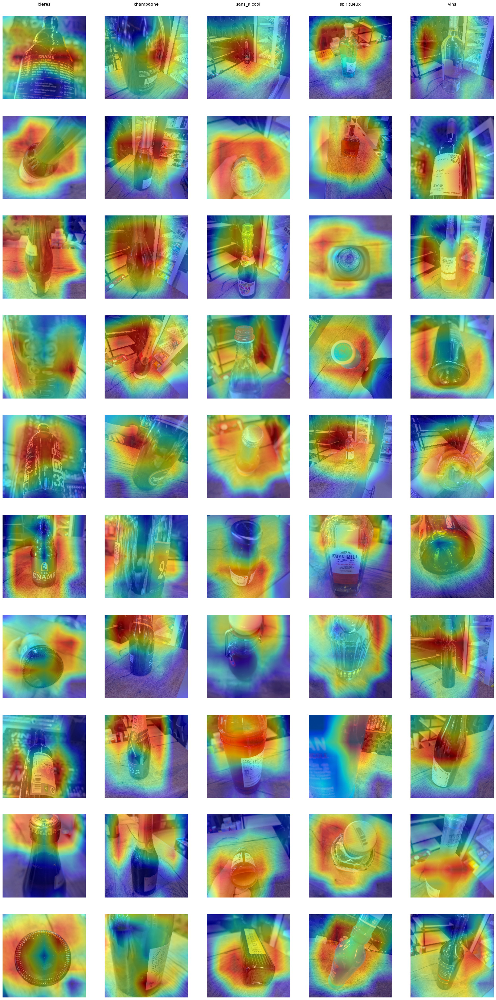

In [32]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib import cm
from tensorflow.keras.applications import MobileNetV2
from tf_keras_vis.gradcam_plus_plus import GradcamPlusPlus
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear
from tf_keras_vis.utils.scores import CategoricalScore

# Create GradCAM++ object
gradcam = GradcamPlusPlus(
    model,
    model_modifier=ReplaceToLinear(),
    clone=True,
)

nb_images_per_class = 10

fig, axs = plt.subplots(nb_images_per_class, len(LABEL_NAMES), figsize=(len(LABEL_NAMES) * 5, nb_images_per_class * 5))

for label_idx, label_name in enumerate(LABEL_NAMES):
    axs[0,label_idx].set_title(label_name, loc='center', y=1.1)
    
    i = 0
    for _, rowdata in train_df[train_df['label'] == label_name].sample(frac=1).head(nb_images_per_class).iterrows():
        img = open_image(rowdata.path)    
        pred = model(np.expand_dims(img, axis=0))

        # Generate cam with GradCAM++
        score = CategoricalScore(np.argmax(pred))
        cam = gradcam(score, img)
        heatmap = np.uint8(cm.jet(cam[0])[..., :3] * 255)

        axs[i,label_idx].imshow(img, vmin=0, vmax=1)
        axs[i,label_idx].imshow(heatmap, cmap='jet', alpha=0.5) # overlay
        axs[i,label_idx].axis("off")

        i += 1

### Grad-cam on misclassified images

**TODO**: now do the same than above, but with the misclassified images. You shouldn't change anything pertaining to grad-cam besides on which image and prediction you do it

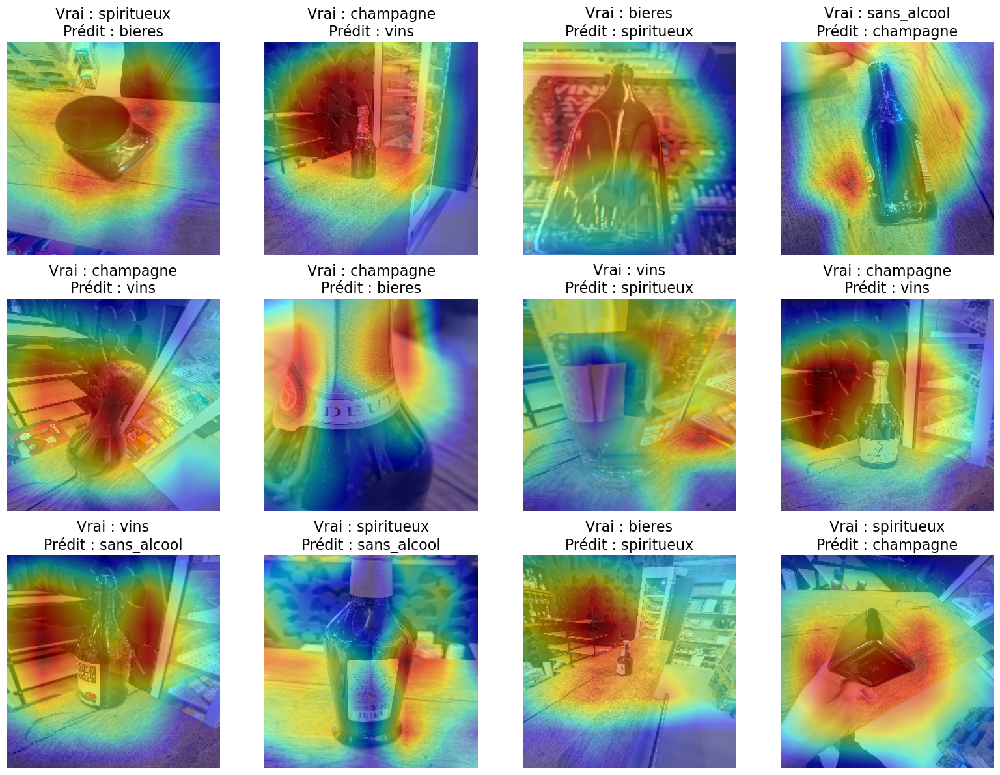

In [35]:
# Grad-CAM sur k images mal classées, affichage 4 par ligne
k = 12                                   # nombre d’images à afficher
sample_idx = np.random.choice(mis_idx, k, replace=False)

n_cols = 4
n_rows = int(np.ceil(k / n_cols))
fig, axs = plt.subplots(n_rows, n_cols,
                        figsize=(n_cols * 4, n_rows * 4))

for pos, idx in enumerate(sample_idx):
    r, c = divmod(pos, n_cols)
    ax   = axs[r, c]
    
    img   = orig_images[idx] / 255.0
    score = CategoricalScore(y_pred_full[idx])
    cam   = gradcam(score, img)[0]
    heat  = np.uint8(cm.jet(cam)[..., :3] * 255)
    
    ax.imshow(img)
    ax.imshow(heat, alpha=0.5)
    ax.set_title(f"Vrai : {class_names[y_true_full[idx]]}\nPrédit : {class_names[y_pred_full[idx]]}",
                 fontsize=16)
    ax.axis("off")

# Masque les cases vides éventuelles
for rem in range(pos + 1, n_rows * n_cols):
    fig.axes[rem].axis("off")

plt.tight_layout()
plt.show()


**TODO**: try to determine what caused the misclassifcations and what you can do about it

Analyse des erreurs de classification et pistes d’amélioration
Constats à partir des Grad-CAM

L’attention du réseau se porte souvent sur l’arrière-plan (table, billets, étagères) plutôt que sur la bouteille ou son étiquette ; il manque donc un signal visuel distinctif.

Les classes champagne, vins et spiritueux partagent des formes/couleurs proches (verre transparent + liquide ambré), ce qui provoque des confusions systématiques.

Quelques photos sont floues, mal cadrées ou sous-exposées : la zone pertinente est petite ou occulte ; le modèle n’apprend pas les bons motifs.

Le modèle n’a été entraîné que sur les couches de tête ; les poids ImageNet restent gelés et peu adaptés à notre domaine.

Actions possibles

Collecte / équilibrage du dataset

Ajouter plus d’images par classe (étiquettes visibles, angles variés).

Veiller à équilibrer les effectifs pour réduire le biais vers les classes majoritaires.

Nettoyage & pré-traitement

Recadrer manuellement ou automatiquement autour de la bouteille (segmentation ou détection d’objet).

Retirer les images floues, trop sombres ou avec arrière-plan dominant.

Augmentations ciblées

Ajouter RandomBrightnessContrast, RandomCrop ou RandomHue pour rendre le modèle moins sensible à l’éclairage et plus concentré sur la forme.

Utiliser RandomRotation(0.2) et RandomZoom(0.2) pour mieux couvrir les variations d’angle.

Fine-tuning plus profond

Dégeler progressivement les derniers blocs de MobileNet V2 (par ex. les 3–4 derniers) et ré-entraîner avec un learning rate faible (1e-5).

Envisager un modèle plus petit mais entièrement fine-tuné (EfficientNet-B0).

Pondération de classes / focal loss

Appliquer un class_weight ou une focal loss pour pénaliser davantage les erreurs sur classes minoritaires.

Validation plus stricte

Utiliser un vrai dossier test indépendant (pas issu du même shooting) pour éviter la fuite de données et mieux estimer la généralisation.

Exploration d’indices textuels

Extraire et reconnaître le texte des étiquettes (OCR) puis fusionner avec la vision (multimodalité) pour distinguer champagne/vin.

En appliquant d’abord les étapes 1 → 4 (plus de données propres + fine-tuning partiel), on devrait déjà réduire significativement le taux d’erreur.